In [2]:
# ! pip install torch -U

# Sampling

NN tries to fully predict the noise at each step

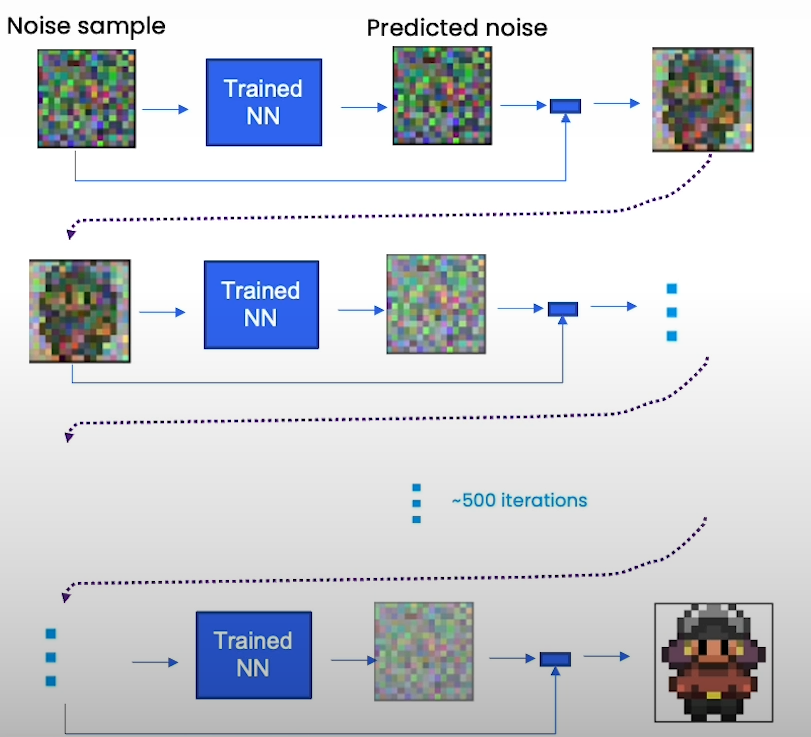

In [4]:
from typing import Dict, Tuple
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import models, transforms
from torchvision.utils import save_image, make_grid
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import numpy as np
from IPython.display import HTML
from diffusion_utilities import *

/root/miniconda3/envs/ankit_vision/lib/python3.11/site-packages/transformers/utils/generic.py:481: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(


In [5]:
class ContextUnet(nn.Module):
    def __init__(self, in_channels, n_feat=256, n_cfeat=10, height=28):  # cfeat - context features
        super(ContextUnet, self).__init__()

        # number of input channels, number of intermediate feature maps and number of classes
        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_cfeat = n_cfeat
        self.h = height  #assume h == w. must be divisible by 4, so 28,24,20,16...

        # Initialize the initial convolutional layer
        self.init_conv = ResidualConvBlock(in_channels, n_feat, is_res=True)

        # Initialize the down-sampling path of the U-Net with two levels
        self.down1 = UnetDown(n_feat, n_feat)        # down1 #[10, 256, 8, 8]
        self.down2 = UnetDown(n_feat, 2 * n_feat)    # down2 #[10, 256, 4,  4]
        
         # original: self.to_vec = nn.Sequential(nn.AvgPool2d(7), nn.GELU())
        self.to_vec = nn.Sequential(nn.AvgPool2d((4)), nn.GELU())

        # Embed the timestep and context labels with a one-layer fully connected neural network
        self.timeembed1 = EmbedFC(1, 2*n_feat)
        self.timeembed2 = EmbedFC(1, 1*n_feat)
        self.contextembed1 = EmbedFC(n_cfeat, 2*n_feat)
        self.contextembed2 = EmbedFC(n_cfeat, 1*n_feat)

        # Initialize the up-sampling path of the U-Net with three levels
        self.up0 = nn.Sequential(
            nn.ConvTranspose2d(2 * n_feat, 2 * n_feat, self.h//4, self.h//4), # up-sample  
            nn.GroupNorm(8, 2 * n_feat), # normalize                       
            nn.ReLU(),
        )
        self.up1 = UnetUp(4 * n_feat, n_feat)
        self.up2 = UnetUp(2 * n_feat, n_feat)

        # Initialize the final convolutional layers to map to the same number of channels as the input image
        self.out = nn.Sequential(
            nn.Conv2d(2 * n_feat, n_feat, 3, 1, 1), # reduce number of feature maps   #in_channels, out_channels, kernel_size, stride=1, padding=0
            nn.GroupNorm(8, n_feat), # normalize
            nn.ReLU(),
            nn.Conv2d(n_feat, self.in_channels, 3, 1, 1), # map to same number of channels as input
        )

    def forward(self, x, t, c=None):
        """
        x : (batch, n_feat, h, w) : input image
        t : (batch, n_cfeat)      : time step
        c : (batch, n_classes)    : context label
        """
        # x is the input image, c is the context label, t is the timestep, context_mask says which samples to block the context on

        # pass the input image through the initial convolutional layer
        x = self.init_conv(x)
        # pass the result through the down-sampling path
        down1 = self.down1(x)       #[10, 256, 8, 8]
        down2 = self.down2(down1)   #[10, 256, 4, 4]
        
        # convert the feature maps to a vector and apply an activation
        hiddenvec = self.to_vec(down2)
        
        # mask out context if context_mask == 1
        if c is None:
            c = torch.zeros(x.shape[0], self.n_cfeat).to(x)
            
        # embed context and timestep
        cemb1 = self.contextembed1(c).view(-1, self.n_feat * 2, 1, 1)     # (batch, 2*n_feat, 1,1)
        temb1 = self.timeembed1(t).view(-1, self.n_feat * 2, 1, 1)
        cemb2 = self.contextembed2(c).view(-1, self.n_feat, 1, 1)
        temb2 = self.timeembed2(t).view(-1, self.n_feat, 1, 1)
        #print(f"uunet forward: cemb1 {cemb1.shape}. temb1 {temb1.shape}, cemb2 {cemb2.shape}. temb2 {temb2.shape}")


        up1 = self.up0(hiddenvec)
        up2 = self.up1(cemb1*up1 + temb1, down2)  # add and multiply embeddings
        up3 = self.up2(cemb2*up2 + temb2, down1)
        out = self.out(torch.cat((up3, x), 1))
        return out


In [6]:
# hyperparameters

# diffusion hyperparameters
timesteps = 500
beta1 = 1e-4  #  the range of variance schedule for the noise added at each time step
beta2 = 0.02

# network hyperparameters
device = torch.device("cuda:0" if torch.cuda.is_available() else torch.device('cpu'))
n_feat = 64 # 64 hidden dimension feature
n_cfeat = 5 # context vector is of size 5
height = 16 # 16x16 image
save_dir = './weights'

In [7]:
# construct DDPM noise schedule
b_t = (beta2 - beta1) * torch.linspace(0, 1, timesteps + 1, device=device) + beta1 # sequence of beta values which gradually increase from beta1 to beta2.
a_t = 1 - b_t
ab_t = torch.cumsum(a_t.log(), dim=0).exp()     # the cumulative product of the a_t values
ab_t[0] = 1

In [8]:
# construct model
nn_model = ContextUnet(in_channels=3, n_feat=n_feat, n_cfeat=n_cfeat, height=height).to(device)

## Training

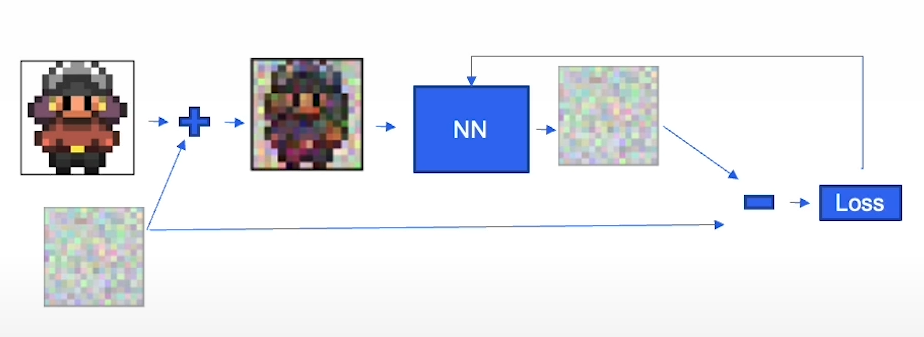

In [10]:
# training hyperparameters
batch_size = 100
n_epoch = 32
lrate=1e-3

In [11]:
# load dataset and construct optimizer
dataset = CustomDataset("sprites_1788_16x16.npy", "sprite_labels_nc_1788_16x16.npy", transform, null_context=False)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=1)
optim = torch.optim.Adam(nn_model.parameters(), lr=lrate)

sprite shape: (89400, 16, 16, 3)
labels shape: (89400, 5)


In [12]:
# helper function: perturbs an image to a specified noise level
def perturb_input(x, t, noise):
    return ab_t.sqrt()[t, None, None, None] * x + (1 - ab_t[t, None, None, None]) * noise

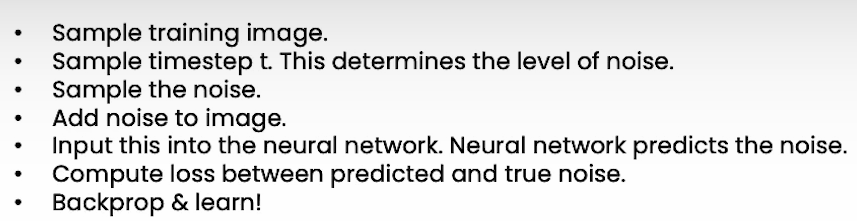

In [13]:
# training without context code

# set into train mode
nn_model.train()

for ep in range(n_epoch):
    print(f'epoch {ep}')
    
    # linearly decay learning rate
    optim.param_groups[0]['lr'] = lrate*(1-ep/n_epoch)
    
    pbar = tqdm(dataloader, mininterval=2 ) # 1. Sampling training image
    for x, _ in pbar:   
        optim.zero_grad()
        x = x.to(device)
        
        # perturb data
        t = torch.randint(1, timesteps + 1, (x.shape[0],)).to(device) # 2. Sample random time step t and determine noise level
        noise = torch.randn_like(x) # 3. sample a noise to be added to the image
        x_pert = perturb_input(x, t, noise) # 4. Add the noise to the image
        
        # use network to recover noise
        pred_noise = nn_model(x_pert, t / timesteps) # 5. Input the perturbed image and time step to the network to recover the noise
        
        # loss is mean squared error between the predicted and true noise
        loss = F.mse_loss(pred_noise, noise) # 6. Compute the loss between the predicted noise and the true noise
        loss.backward() # 7. Back-propagate the loss
        
        optim.step()

    # save model periodically
    if ep%4==0 or ep == int(n_epoch-1):
        if not os.path.exists(save_dir):
            os.mkdir(save_dir)
        torch.save(nn_model.state_dict(), save_dir + f"model_{ep}.pth")
        print('saved model at ' + save_dir + f"model_{ep}.pth")

epoch 0


  0%|          | 0/894 [00:00<?, ?it/s]/root/miniconda3/envs/ankit_vision/lib/python3.11/site-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at /opt/conda/conda-bld/pytorch_1712608853099/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
100%|██████████| 894/894 [00:11<00:00, 76.75it/s]


saved model at ./weightsmodel_0.pth
epoch 1


100%|██████████| 894/894 [00:10<00:00, 82.90it/s]


epoch 2


100%|██████████| 894/894 [00:11<00:00, 76.90it/s]


epoch 3


100%|██████████| 894/894 [00:11<00:00, 79.03it/s]


epoch 4


100%|██████████| 894/894 [00:11<00:00, 79.93it/s]


saved model at ./weightsmodel_4.pth
epoch 5


100%|██████████| 894/894 [00:11<00:00, 76.81it/s]


epoch 6


100%|██████████| 894/894 [00:10<00:00, 81.79it/s]


epoch 7


100%|██████████| 894/894 [00:10<00:00, 82.39it/s]


epoch 8


100%|██████████| 894/894 [00:11<00:00, 80.10it/s]


saved model at ./weightsmodel_8.pth
epoch 9


100%|██████████| 894/894 [00:11<00:00, 80.69it/s]


epoch 10


100%|██████████| 894/894 [00:11<00:00, 77.69it/s]


epoch 11


100%|██████████| 894/894 [00:10<00:00, 81.96it/s]


epoch 12


100%|██████████| 894/894 [00:11<00:00, 78.92it/s]


saved model at ./weightsmodel_12.pth
epoch 13


100%|██████████| 894/894 [00:10<00:00, 82.01it/s]


epoch 14


100%|██████████| 894/894 [00:11<00:00, 79.55it/s]


epoch 15


100%|██████████| 894/894 [00:10<00:00, 81.55it/s]


epoch 16


100%|██████████| 894/894 [00:10<00:00, 82.31it/s]


saved model at ./weightsmodel_16.pth
epoch 17


100%|██████████| 894/894 [00:10<00:00, 82.42it/s]


epoch 18


100%|██████████| 894/894 [00:11<00:00, 80.43it/s]


epoch 19


100%|██████████| 894/894 [00:11<00:00, 79.11it/s]


epoch 20


100%|██████████| 894/894 [00:10<00:00, 81.45it/s]


saved model at ./weightsmodel_20.pth
epoch 21


100%|██████████| 894/894 [00:11<00:00, 80.30it/s]


epoch 22


100%|██████████| 894/894 [00:10<00:00, 82.44it/s]


epoch 23


100%|██████████| 894/894 [00:11<00:00, 80.28it/s]


epoch 24


100%|██████████| 894/894 [00:10<00:00, 82.66it/s]


saved model at ./weightsmodel_24.pth
epoch 25


100%|██████████| 894/894 [00:11<00:00, 76.69it/s]


epoch 26


100%|██████████| 894/894 [00:11<00:00, 79.18it/s]


epoch 27


100%|██████████| 894/894 [00:11<00:00, 79.06it/s]


epoch 28


100%|██████████| 894/894 [00:11<00:00, 78.43it/s]


saved model at ./weightsmodel_28.pth
epoch 29


100%|██████████| 894/894 [00:10<00:00, 81.84it/s]


epoch 30


100%|██████████| 894/894 [00:11<00:00, 81.00it/s]


epoch 31


100%|██████████| 894/894 [00:11<00:00, 81.01it/s]

saved model at ./weightsmodel_31.pth


## Sampling:

In [34]:
# helper function; removes the predicted noise (but adds some noise back in to avoid collapse)
def denoise_add_noise(x, t, pred_noise, z=None):
    if z is None:
        z = torch.randn_like(x)
    noise = b_t.sqrt()[t] * z
    mean = (x - pred_noise * ((1 - a_t[t]) / (1 - ab_t[t]).sqrt())) / a_t[t].sqrt() # removing the predicted noise from the image x
    return mean + noise

"""Adding noise back is critical to ensure that the sampling process introduces enough randomness to generate diverse and high-quality images, 
avoiding the potential collapse where the model might produce overly smooth or degenerate outputs."""

'Adding noise back is critical to ensure that the sampling process introduces enough randomness to generate diverse and high-quality images, \navoiding the potential collapse where the model might produce overly smooth or degenerate outputs.'

In [15]:
# load in model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"{save_dir}/model_trained.pth", map_location=device))
nn_model.eval()
print("Loaded in Model")

Loaded in Model


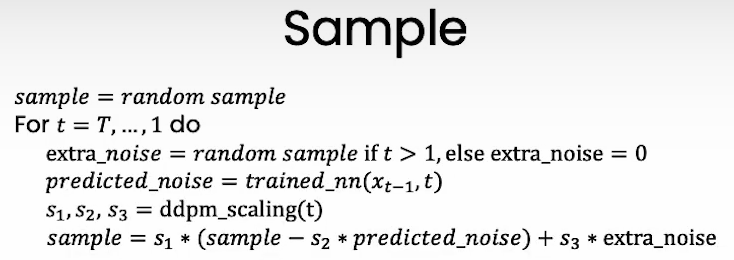
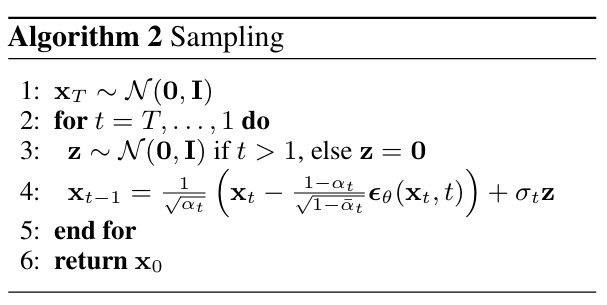

In [16]:
# sample using standard algorithm
@torch.no_grad()
def sample_ddpm(n_sample, save_rate=20):
    # x_T ~ N(0, 1), sample initial noise
    samples = torch.randn(n_sample, 3, height, height).to(device)  # 1. sample random noise samples

    # array to keep track of generated steps for plotting
    intermediate = [] 
    for i in range(timesteps, 0, -1): # 2. Step backwards through time from T to 1
        print(f'sampling timestep {i:3d}', end='\r')

        # reshape time tensor
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)

        # sample some random noise to inject back in. For i = 1, don't add back in noise
        z = torch.randn_like(samples) if i > 1 else 0 # 3. sample noise z ~ N(0, 1)

        eps = nn_model(samples, t)    # 4. predict noise e_(x_t,t), which is the noise to add back in to denoise the image
        samples = denoise_add_noise(samples, i, eps, z) # 6. Sampling Algorithm ddpm
        
        if i % save_rate ==0 or i==timesteps or i<8:
            intermediate.append(samples.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return samples, intermediate

In [18]:
# visualize samples
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

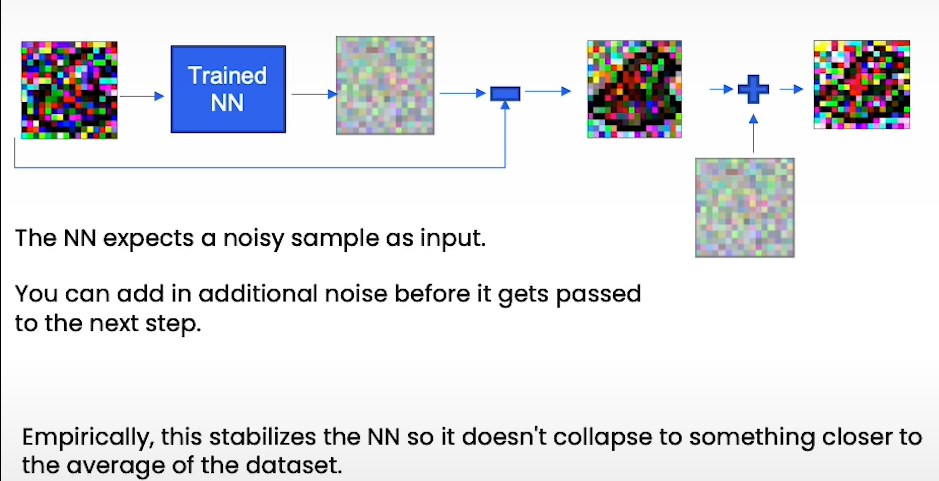

Model expects a noisy sample which is normally distributed and once we de-noise it it's not distributed normally, so we do add up some noise back

#### Demonstrate incorrectly sample without adding the 'extra noise'


In [19]:
# incorrectly sample without adding in noise
@torch.no_grad()
def sample_ddpm_incorrect(n_sample):
    # x_T ~ N(0, 1), sample initial noise
    samples = torch.randn(n_sample, 3, height, height).to(device)  

    # array to keep track of generated steps for plotting
    intermediate = [] 
    for i in range(timesteps, 0, -1):
        print(f'sampling timestep {i:3d}', end='\r')

        # reshape time tensor
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)

        # don't add back in noise
        z = 0

        eps = nn_model(samples, t)    # predict noise e_(x_t,t)
        samples = denoise_add_noise(samples, i, eps, z)
        if i%20==0 or i==timesteps or i<8:
            intermediate.append(samples.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return samples, intermediate

In [20]:
# visualize samples
plt.clf()
samples, intermediate = sample_ddpm_incorrect(32)
animation = plot_sample(intermediate,32,4,save_dir, "ani_run", None, save=False)
HTML(animation.to_jshtml())

<Figure size 640x480 with 0 Axes>

### View Epoch 0

In [23]:
# load in model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"/home/ankit/Diffusion_model/code/weightsmodel_0.pth", map_location=device))
nn_model.eval()
print("Loaded in Model")

Loaded in Model


In [24]:
# visualize samples
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

### View Epoch 4

In [25]:
# load in model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"/home/ankit/Diffusion_model/code/weightsmodel_4.pth", map_location=device))
nn_model.eval()
print("Loaded in Model")

Loaded in Model


In [26]:
# visualize samples
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

### View Epoch 8

In [28]:
# load in model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"/home/ankit/Diffusion_model/code/weightsmodel_8.pth", map_location=device))
nn_model.eval()
print("Loaded in Model")

Loaded in Model


In [29]:
# visualize samples
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

### View Epoch 31

In [30]:
# load in model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"/home/ankit/Diffusion_model/code/weightsmodel_31.pth", map_location=device))
nn_model.eval()
print("Loaded in Model")

Loaded in Model


In [31]:
# visualize samples
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>